# Imports

In [1]:
# Importacao das libraries
import numpy as np
import pandas as pd
import yfinance as yf
import riskfolio as rp
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")
pd.options.display.float_format = '{:.2f}'.format

# Data

In [2]:
tickers = ["SPY", "EXSA.DE", "AAXJ", "JPXN", "EEM", "BND", "VWEHX", "GLD", "VNQ", "BIL"]
tickers.sort()

# Analise personalizada
start_date = '2004-01-01'
end_date = '2023-12-31'

In [3]:
# Download das cotacoes
quotes = yf.download(tickers, start=start_date, end=end_date, auto_adjust=True)

[*********************100%***********************]  10 of 10 completed


In [4]:
quotes.tail()

Price      Close                                                            \
Ticker      AAXJ   BIL   BND   EEM EXSA.DE    GLD  JPXN    SPY   VNQ VWEHX   
Date                                                                         
2023-12-22 63.75 85.96 70.08 38.46   45.82 190.27 65.64 466.25 83.51  4.99   
2023-12-26 64.20 85.98 70.14 38.76     NaN 191.72 65.63 468.22 84.13  4.99   
2023-12-27 64.55 85.98 70.59 38.99   45.91 192.59 66.01 469.06 84.54  4.99   
2023-12-28 65.30 86.03 70.42 39.29   45.82 191.47 66.42 469.24 85.14  4.99   
2023-12-29 65.37 86.03 70.26 39.27   45.92 191.17 66.49 467.88 84.13  5.02   

Price       ...     Volume                                              \
Ticker      ...       AAXJ        BIL        BND         EEM   EXSA.DE   
Date        ...                                                          
2023-12-22  ...  547800.00 7443300.00 5890700.00 17082900.00 145915.00   
2023-12-26  ...  388600.00 4638800.00 6394600.00 16173200.00       NaN   
2023-12-27  ... 1208200.00 4717700.00 7467700.00 30120600.00 124830.00   
2023-12-28  ...  406000.00 5605100.00 8166600.00 36660400.00  76742.00   
2023-12-29  ...  481200.00 5576800.00 6939500.00 48756900.00 159436.00   

Price                                                         
Ticker            GLD     JPXN          SPY        VNQ VWEHX  
Date                                                          
2023-12-22 7175400.00  2500.00  67126600.00 5100000.00  0.00  
2023-12-26 4502700.00  3900.00  55387000.00 4336600.00  0.00  
2023-12-27 5813300.00  3300.00  68000300.00 5383600.00  0.00  
2023-12-28 6171500.00 15200.00  77158100.00 3879100.00  0.00  
2023-12-29 4610300.00  1500.00 122234100.00 5331500.00  0.00  

[5 rows x 50 columns]

In [5]:
prices = quotes['Close']
prices.tail()

Ticker,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
Date,,,,,,,,,,
2023-12-22,63.75,85.96,70.08,38.46,45.82,190.27,65.64,466.25,83.51,4.99
2023-12-26,64.20,85.98,70.14,38.76,NaN,191.72,65.63,468.22,84.13,4.99
2023-12-27,64.55,85.98,70.59,38.99,45.91,192.59,66.01,469.06,84.54,4.99
2023-12-28,65.30,86.03,70.42,39.29,45.82,191.47,66.42,469.24,85.14,4.99
2023-12-29,65.37,86.03,70.26,39.27,45.92,191.17,66.49,467.88,84.13,5.02


In [6]:
# Guardar Dados
# prices.to_csv('quotes_CP2.csv', date_format='%Y-%m-%d')

In [7]:
# Ler Dados Guardados
quotes = pd.read_csv("quotes_CP2.csv", index_col=[0], parse_dates=True)

In [8]:
quotes_semanal = quotes.resample('W').last()
quotes_mensal = quotes.resample('BM').last()
quotes_trimestral = quotes.resample('Q').last()
quotes_anual = quotes.resample('A').last()

In [9]:
quotes_anual.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20 entries, 2004-12-31 to 2023-12-31
Freq: YE-DEC
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   AAXJ     16 non-null     float64
 1   BIL      17 non-null     float64
 2   BND      17 non-null     float64
 3   EEM      20 non-null     float64
 4   EXSA.DE  16 non-null     float64
 5   GLD      20 non-null     float64
 6   JPXN     20 non-null     float64
 7   SPY      20 non-null     float64
 8   VNQ      20 non-null     float64
 9   VWEHX    20 non-null     float64
dtypes: float64(10)
memory usage: 1.7 KB


### Gráfico Comparativo Performance

In [10]:
def rebase(df):
    df = df.dropna()
    return (df / df.iloc[0])*100

# Fazer com que as séries temporais comecem do mesmo ponto
df_normalized = rebase(quotes_semanal)

performance_compare = go.Figure()
# Iterate over the tickers list
for column in df_normalized.columns:
    performance_compare.add_trace(go.Scatter(name=f'{column}', x=df_normalized.index, y=df_normalized[column]))

# Add watermark as text
performance_compare.add_annotation(
x=0.5,
y=0.5,
textangle=0,
opacity=0.1,
text="Rui Caseiro",
showarrow=False,
font=dict(family="Arial", size=100, color="black"),
xref="paper",
yref="paper"
)

# Acrescentar tema
performance_compare.update_layout(template='simple_white',
                title='Analise comparativa de performance',
                height=700,
                width=1200,
                hovermode="x unified",
                showlegend=True,
                legend=dict(yanchor="bottom", y=1, xanchor="center",x=0.5, orientation='h'),
                xaxis=dict(title='Data', showgrid=False, zeroline=False, showline=False, mirror=True),
                yaxis=dict(title='Valorização (%)', ticksuffix=' %', showgrid=False, zeroline=True, showline=False, mirror=True, type='log'),
                ).show()

## Mapa de calor de correlação

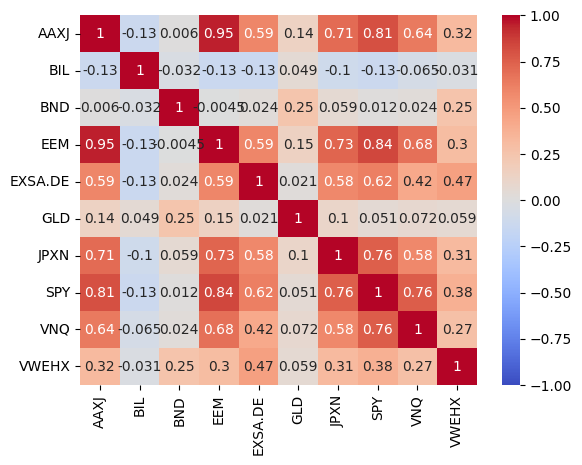

In [11]:
# Calcular e usar retornos para comparações de correlação
# dropna Remove all rows wit NULL values from the DataFrame
# corr dá a correlação entre os ativos
quotes_pct_ret_corr = quotes.pct_change().dropna().corr()

sns.heatmap(quotes_pct_ret_corr, annot=True, vmin=-1, vmax=1, cmap='coolwarm')
plt.show()

In [12]:
# Tabela de correlacoes
quotes_pct_ret_corr

,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
AAXJ,1.00,-0.13,0.01,0.95,0.59,0.14,0.71,0.81,0.64,0.32
BIL,-0.13,1.00,-0.03,-0.13,-0.13,0.05,-0.10,-0.13,-0.07,-0.03
BND,0.01,-0.03,1.00,-0.00,0.02,0.25,0.06,0.01,0.02,0.25
EEM,0.95,-0.13,-0.00,1.00,0.59,0.15,0.73,0.84,0.68,0.30
EXSA.DE,0.59,-0.13,0.02,0.59,1.00,0.02,0.58,0.62,0.42,0.47
GLD,0.14,0.05,0.25,0.15,0.02,1.00,0.10,0.05,0.07,0.06
JPXN,0.71,-0.10,0.06,0.73,0.58,0.10,1.00,0.76,0.58,0.31
SPY,0.81,-0.13,0.01,0.84,0.62,0.05,0.76,1.00,0.76,0.38
VNQ,0.64,-0.07,0.02,0.68,0.42,0.07,0.58,0.76,1.00,0.27
VWEHX,0.32,-0.03,0.25,0.30,0.47,0.06,0.31,0.38,0.27,1.00


### Gráfico de Barras

In [13]:
# Calcular os retornos anuais
quotes_anual_pct_ret = quotes_anual.pct_change().dropna()

In [14]:
year_returns = go.Figure()
# Iterate over the tickers list
for ticker in tickers:
    year_returns.add_trace(go.Bar(name= f'{ticker}', x=quotes_anual_pct_ret.index, y=quotes_anual_pct_ret[ticker]))

# Alterações ao gráfico
year_returns.update_layout(barmode='group', # Colocar as barras em grupo
            title='Rentabilidades anuais dos ativos analisados',
            yaxis_tickformat = '.2%', # Colocar o eixo dos y em percentagem
            template='simple_white', # Escolhemos um template que achemos bonito
            height=700, width=1200,
            showlegend=True,
            legend=dict(yanchor="bottom", y=1, xanchor="center", x=0.5, orientation='h')
            ).show()

In [15]:
# Tabela dos retornos anuais
quotes_anual_pct_ret

,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
Date,,,,,,,,,,
2009-12-31,0.68,0.00,0.04,0.69,0.27,0.24,0.03,0.26,0.30,0.39
2010-12-31,0.16,-0.00,0.06,0.17,0.10,0.29,0.14,0.15,0.28,0.12
2011-12-31,-0.20,-0.00,0.08,-0.19,-0.12,0.10,-0.17,0.02,0.09,0.07
2012-12-31,0.24,-0.00,0.03,0.19,0.14,0.07,0.12,0.16,0.18,0.14
2013-12-31,0.02,-0.00,-0.02,-0.04,0.21,-0.28,0.26,0.32,0.02,0.05
2014-12-31,0.03,-0.00,0.06,-0.04,0.07,-0.02,-0.07,0.13,0.30,0.05
2015-12-31,-0.10,-0.00,0.01,-0.16,0.11,-0.11,0.10,0.01,0.02,-0.01
2016-12-31,0.05,0.00,0.03,0.11,0.02,0.08,0.03,0.12,0.09,0.11
2017-12-31,0.42,0.01,0.04,0.37,0.11,0.13,0.24,0.22,0.05,0.07


### Media de retornos aritmeticos

In [16]:
# 5 Year rolling mean

five_year_rolling_mean = quotes_anual.pct_change(5).dropna()
five_year_rolling_mean

,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
Date,,,,,,,,,,
2013-12-31,0.96,0.00,0.20,0.83,0.70,0.34,0.38,1.27,1.18,1.00
2014-12-31,0.20,-0.00,0.22,0.04,0.44,0.06,0.25,1.04,1.19,0.50
2015-12-31,-0.08,-0.00,0.16,-0.25,0.45,-0.27,0.20,0.80,0.75,0.32
2016-12-31,0.21,-0.00,0.10,0.02,0.67,-0.28,0.49,0.97,0.75,0.37
2017-12-31,0.39,0.01,0.11,0.18,0.61,-0.24,0.65,1.07,0.56,0.28
2018-12-31,0.16,0.02,0.14,0.04,0.19,0.04,0.12,0.49,0.43,0.19
2019-12-31,0.33,0.04,0.17,0.28,0.43,0.26,0.43,0.73,0.41,0.32
2020-12-31,0.83,0.05,0.25,0.78,0.26,0.76,0.50,1.02,0.32,0.41
2021-12-31,0.65,0.05,0.20,0.55,0.55,0.56,0.46,1.32,0.70,0.31


In [17]:
# 10 Year rolling mean

ten_year_rolling_mean = quotes_anual.pct_change(10).dropna()
ten_year_rolling_mean

,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
Date,,,,,,,,,,
2018-12-31,1.28,0.02,0.36,0.90,1.03,0.40,0.55,2.40,2.12,1.38
2019-12-31,0.60,0.04,0.43,0.33,1.05,0.33,0.79,2.53,2.09,0.98
2020-12-31,0.70,0.05,0.45,0.34,0.83,0.29,0.80,2.63,1.30,0.87
2021-12-31,1.00,0.05,0.32,0.59,1.58,0.12,1.17,3.58,1.97,0.80
2022-12-31,0.29,0.06,0.11,0.06,1.02,0.05,0.62,2.23,0.86,0.44
2023-12-31,0.34,0.11,0.20,0.20,0.94,0.65,0.54,2.08,1.04,0.53


### Analise de retornos de janelas temporais

Probabilide de lucro em diversos horizontes temporais.

In [18]:
lookbacks = [6, 12, 24, 60, 120]
time_window_df = pd.DataFrame(columns=[f'{lookback}-month' for lookback in lookbacks], 
                              index=quotes_mensal.columns)

for lookback in lookbacks:
    lookback_monthly_returns = quotes_mensal.pct_change(lookback)
    pct_positive = (lookback_monthly_returns > 0).sum() / lookback_monthly_returns.count() * 100
    time_window_df.loc[:, f'{lookback}-month'] = pct_positive.round(1).astype(str) + '%'

time_window_df

,6-month,12-month,24-month,60-month,120-month
AAXJ,60.3%,62.4%,63.4%,84.0%,100.0%
BIL,53.1%,55.3%,59.7%,70.0%,100.0%
BND,68.7%,74.1%,84.2%,98.6%,100.0%
EEM,60.3%,62.3%,57.4%,76.7%,99.2%
EXSA.DE,68.8%,68.9%,86.3%,94.7%,100.0%
GLD,66.1%,65.6%,74.3%,71.8%,92.7%
JPXN,59.0%,62.7%,65.7%,71.7%,94.2%
SPY,77.4%,82.9%,88.4%,92.2%,100.0%
VNQ,68.1%,70.9%,79.8%,95.9%,100.0%
VWEHX,76.9%,82.9%,87.5%,98.9%,100.0%


    - Num horizonte temporal de curto prazo de 6 meses, o ETF com maior probabilidade de gerar retorno positivo é o SPY. 
    - Num horizonte temporal de médio prazo de 5 anos (60 meses), o ETF com maior porbabilidade de gerar retorno positivo é Vanguard High-Yield Corporate Fund Investor Shares.
    - No horizonte de longo prazo de 10 anos, apenas 3 ETF ( EEM, GLD, JPXN ), não apresentaram 100% de probabilidade de geração de retornos positivos.

### Media de retornos geometricos

In [19]:
# Calcular CAGR
def compute_g(FV, PV, n):
    '''
    g = compounded growth
    FV = Future Value
    PV = Present Value
    n = years
    '''
    g = ((FV/PV)**(1/n))-1
    return g

for ticker in quotes_anual.columns:
    n = quotes_anual[ticker].count()
    FV = quotes_anual[ticker].iloc[-1]
    PV = quotes_anual[ticker].iloc[20 - n] # le o primeiro valor maior que 0.
    print(f"CAGR {ticker}: {compute_g(FV, PV, n):.2%}. Periodo de analise: {n} anos.")

CAGR AAXJ: 6.21%. Periodo de analise: 16 anos.
CAGR BIL: 0.74%. Periodo de analise: 17 anos.
CAGR BND: 2.55%. Periodo de analise: 17 anos.
CAGR EEM: 4.91%. Periodo de analise: 20 anos.
CAGR EXSA.DE: 7.75%. Periodo de analise: 16 anos.
CAGR GLD: 7.65%. Periodo de analise: 20 anos.
CAGR JPXN: 3.42%. Periodo de analise: 20 anos.
CAGR SPY: 9.05%. Periodo de analise: 20 anos.
CAGR VNQ: 6.53%. Periodo de analise: 20 anos.
CAGR VWEHX: 5.16%. Periodo de analise: 20 anos.


### Desvios-Padrão

In [20]:
quotes_pct_ret = quotes.pct_change().dropna()
volatility = quotes_anual_pct_ret.std()
volatility

AAXJ      0.24
BIL       0.01
BND       0.06
EEM       0.24
EXSA.DE   0.13
GLD       0.15
JPXN      0.15
SPY       0.14
VNQ       0.18
VWEHX     0.11
dtype: float64

### Exportar as tabelas para CSV

In [21]:
# Media rolante 5 anos
five_year_rolling_mean.to_csv("five_year_rolling.csv", index=True)

# Media rolante 10 anos
ten_year_rolling_mean.to_csv("ten_year_rolling.csv", index=True)

# Analise de retornos de janelas temporais
time_window_df.to_csv("time_window_df.csv", index=True)

# Volatilidade
volatility.to_csv("annualized_volatility.csv", index=True)

# Correlacao
quotes_pct_ret_corr.to_csv("correlacao.csv", index=True)

## Otimizacao Carteira

In [22]:
quotes_pct_ret.tail()

,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
Date,,,,,,,,,,
2023-12-22,-0.01,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00
2023-12-26,0.01,0.00,0.00,0.01,0.00,0.01,-0.00,0.00,0.01,0.00
2023-12-27,0.01,0.00,0.01,0.01,0.00,0.00,0.01,0.00,0.00,0.00
2023-12-28,0.01,0.00,-0.00,0.01,-0.00,-0.01,0.01,0.00,0.01,0.00
2023-12-29,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.01,0.01


In [23]:
quotes_pct_ret.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3968 entries, 2008-08-18 to 2023-12-29
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   AAXJ     3968 non-null   float64
 1   BIL      3968 non-null   float64
 2   BND      3968 non-null   float64
 3   EEM      3968 non-null   float64
 4   EXSA.DE  3968 non-null   float64
 5   GLD      3968 non-null   float64
 6   JPXN     3968 non-null   float64
 7   SPY      3968 non-null   float64
 8   VNQ      3968 non-null   float64
 9   VWEHX    3968 non-null   float64
dtypes: float64(10)
memory usage: 341.0 KB


In [24]:
quotes_pct_ret.isna().sum() # confirmar se todas as linhas têm informação

AAXJ       0
BIL        0
BND        0
EEM        0
EXSA.DE    0
GLD        0
JPXN       0
SPY        0
VNQ        0
VWEHX      0
dtype: int64

In [25]:
port = rp.Portfolio(returns = quotes_pct_ret)

method_mu='hist' # Method to estimate expected returns based on historical data.
method_cov='hist' # Method to estimate covariance matrix based on historical data.

port.assets_stats(method_mu = method_mu, method_cov = method_cov)

model='Classic' # Could be Classic (historical), BL (Black Litterman) or FM (Factor Model)
rm = 'MV' # Risk measure used, MV=Mean Variance(standard deviation), CVaR=Conditional value-at-risk, MDD=Maximum Drawdown, SLPM=Second Lower Partial Moment (Sortino Ratio).
hist = True # Use historical scenarios for risk measures that depend on scenarios
rf = 0 # Risk free rate.
l = 0 # Risk aversion factor, only useful when obj is 'Utility'

# obj = 'MinRisk' # Objective function, could be MinRisk, MaxRet, Utility or Sharpe

t_factor = int(252)
days_per_year = int(252)

You must convert self.cov to a positive definite matrix


## Min Risk Portfolio

In [26]:
obj = 'MinRisk' # Objective function, could be MinRisk, MaxRet, Utility or Sharpe

port.lowerret = None
port.upperdev = None

# Estimate optimal portfolio:
min_risk = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
pd.options.display.float_format = '{:.2%}'.format
display(min_risk.T)
pd.options.display.float_format = None

,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
weights,0.00%,98.50%,1.02%,0.09%,0.22%,0.00%,0.00%,0.11%,0.00%,0.06%


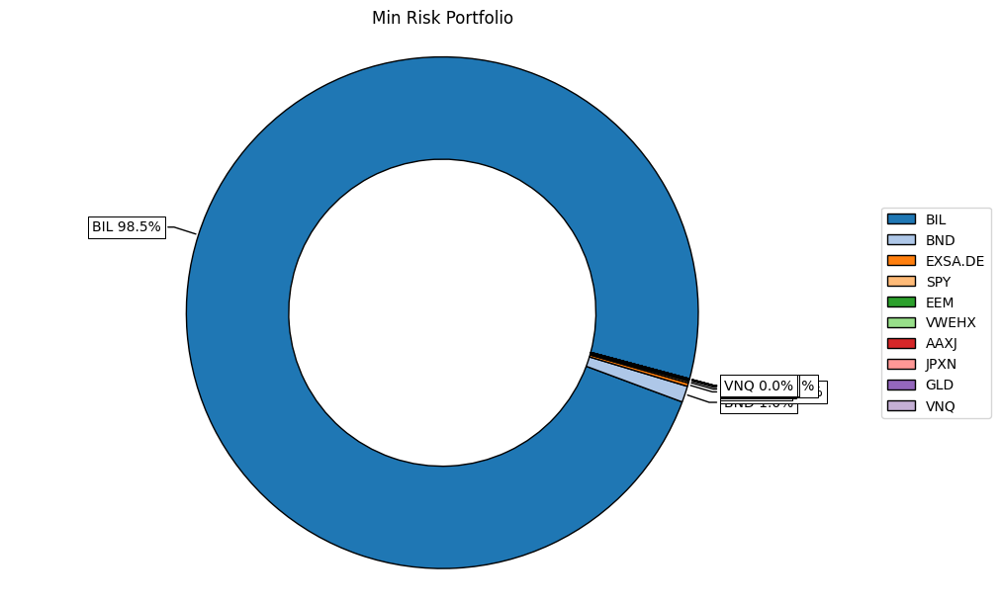

In [27]:
# Plotting the composition of the Min Risk portfolio
ax = rp.plot_pie(w=min_risk, title='Min Risk Portfolio', others=0.05, nrow=10, cmap="tab20", height=6, width=10, ax=None)

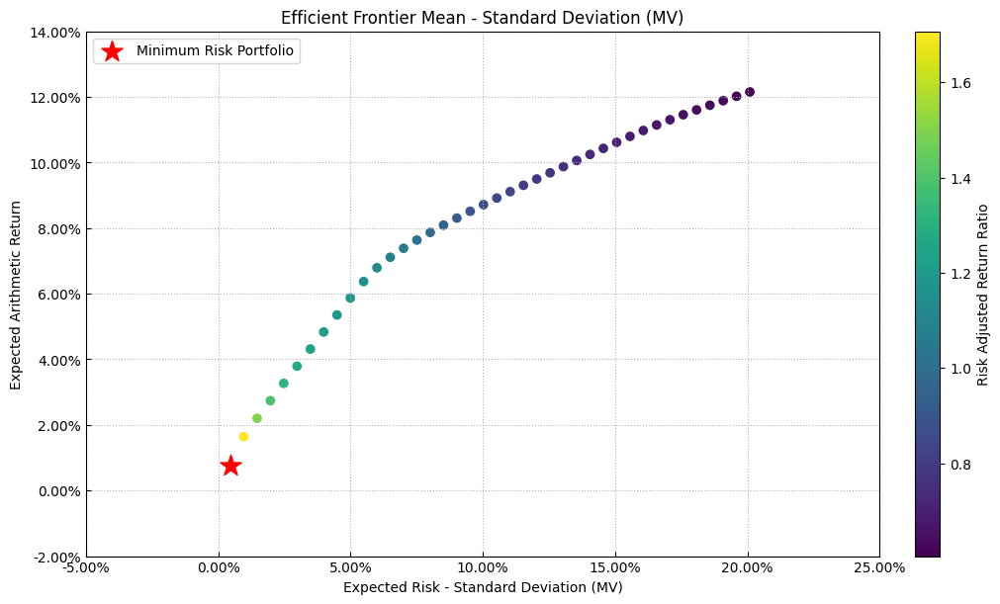

In [28]:
# Minimum Risk Efficiente Frontier
points = 40 # Number of points of the frontier
min_riskfrontier = port.efficient_frontier(model=model, rm=rm, points=points, rf=rf, hist=hist)

# Plotting Minimum Risk Efficient Frontier
ax = rp.plot_frontier(w_frontier=min_riskfrontier, mu=port.mu, cov=port.cov, returns=port.returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=min_risk,label='Minimum Risk Portfolio',
                      marker='*', s=16, c='r', height=6, width=10, ax=None, t_factor=t_factor)

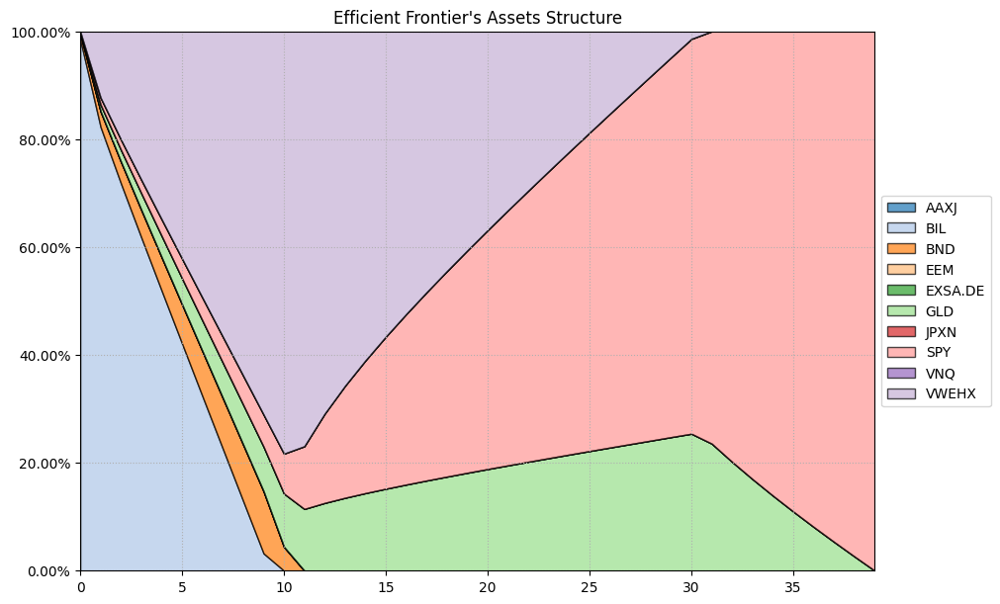

In [29]:
# Plotting efficient frontier composition
ax = rp.plot_frontier_area(w_frontier=min_riskfrontier, cmap="tab20", height=6, width=10, ax=None)

## Maior probabilidade acima obrigacoes do tesouro

In [30]:
rm = 'CVaR' # Risk measure used, MV=Mean Variance(standard deviation), CVaR=Conditional value-at-risk, MDD=Maximum Drawdown, SLPM=Second Lower Partial Moment (Sortino Ratio).
obj = 'MinRisk' # Objective function, could be MinRisk, MaxRet, Utility or Sharpe
port.alpha = 0.05 # Significance level for CVaR, EVaR y CDaR

# retorno minimo exigido obrigacoes 3 meses alemanha
port.lowerret = 0.03415/days_per_year # transform annual return to daily return
port.upperdev = None

# Estimate optimal Cvar portfolio:
cvar_portfolio = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
pd.options.display.float_format = '{:.2%}'.format
display(cvar_portfolio.T)
pd.options.display.float_format = None

,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
weights,0.00%,47.16%,9.72%,0.00%,0.00%,4.49%,0.00%,3.15%,0.00%,35.48%


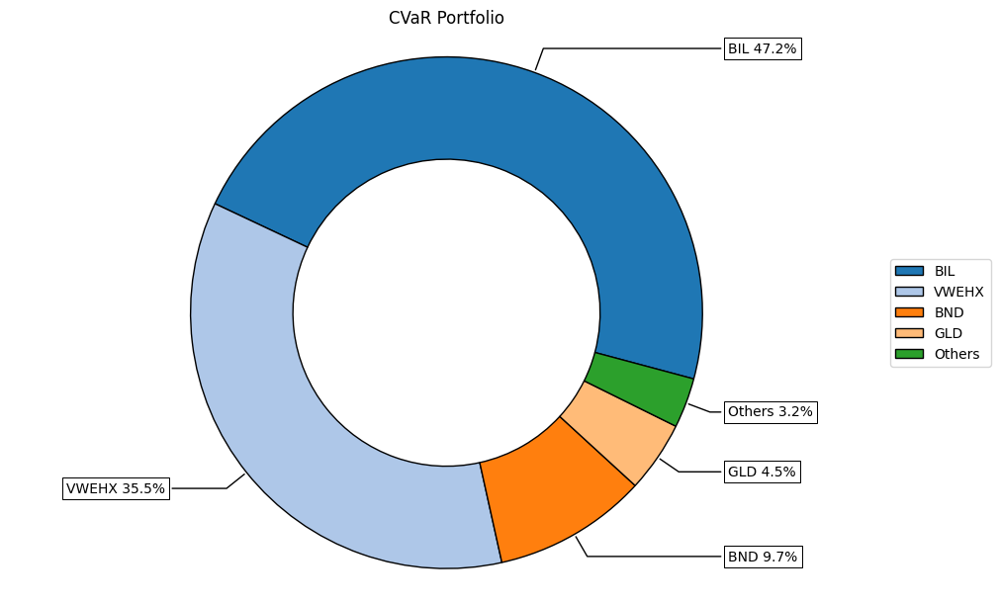

In [31]:
# Plotting the composition of the Min Risk portfolio
ax = rp.plot_pie(w=cvar_portfolio, title='CVaR Portfolio', others=0.05, nrow=10, cmap="tab20", height=6, width=10, ax=None)

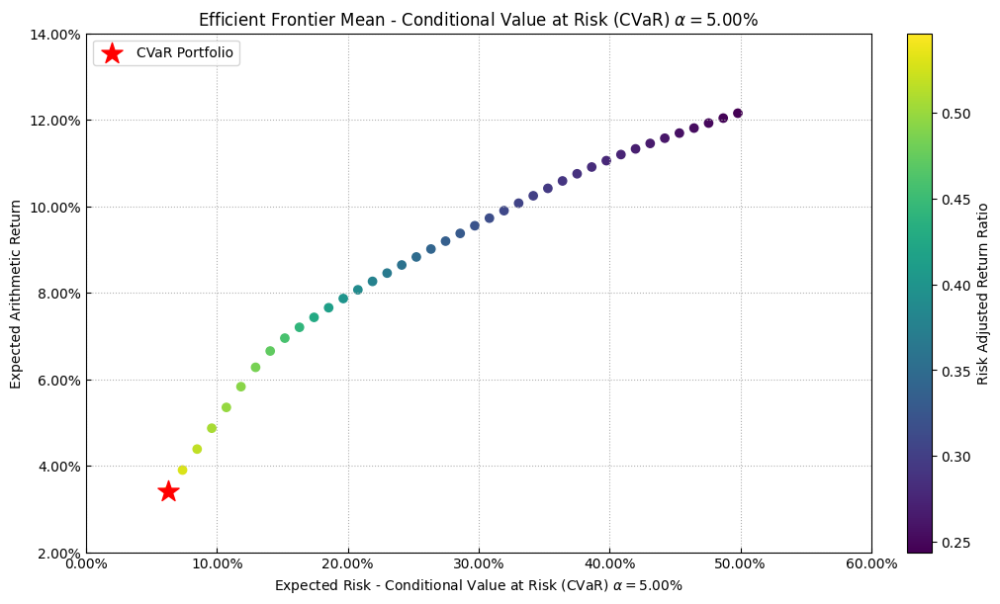

In [32]:
# Efficiente CVaR Frontier
points = 40 # Number of points of the frontier
cvar_frontier = port.efficient_frontier(model=model, rm=rm, points=points, rf=rf, hist=hist)

# Plotting Efficient CVaR Frontier
ax = rp.plot_frontier(w_frontier=cvar_frontier, mu=port.mu, cov=port.cov, returns=port.returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=cvar_portfolio,label='CVaR Portfolio',
                      marker='*', s=16, c='r', height=6, width=10, ax=None, t_factor=t_factor)

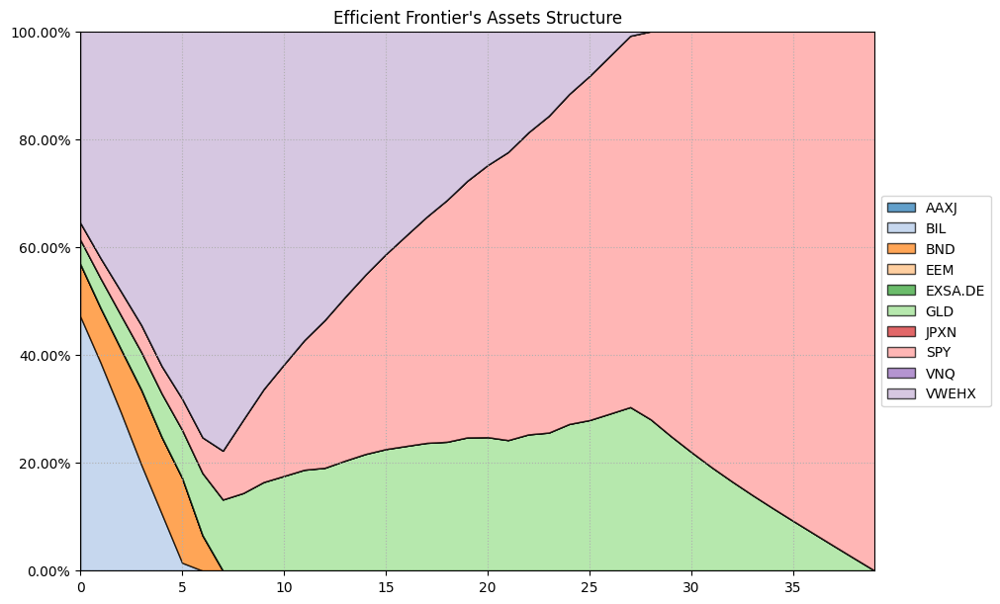

In [33]:
# Plotting efficient frontier composition
ax = rp.plot_frontier_area(w_frontier=cvar_frontier, cmap="tab20", height=6, width=10, ax=None)

## Max Sharpe Ratio

In [34]:
rm = 'MV'
obj = 'Sharpe'

port.lowerret = None
port.upperdev = None

# Estimate optimal portfolio:
max_sharpe = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)
pd.options.display.float_format = '{:.2%}'.format
display(max_sharpe.T)
pd.options.display.float_format = None

,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
weights,0.00%,93.12%,1.70%,0.00%,0.00%,0.30%,0.00%,0.65%,0.00%,4.23%


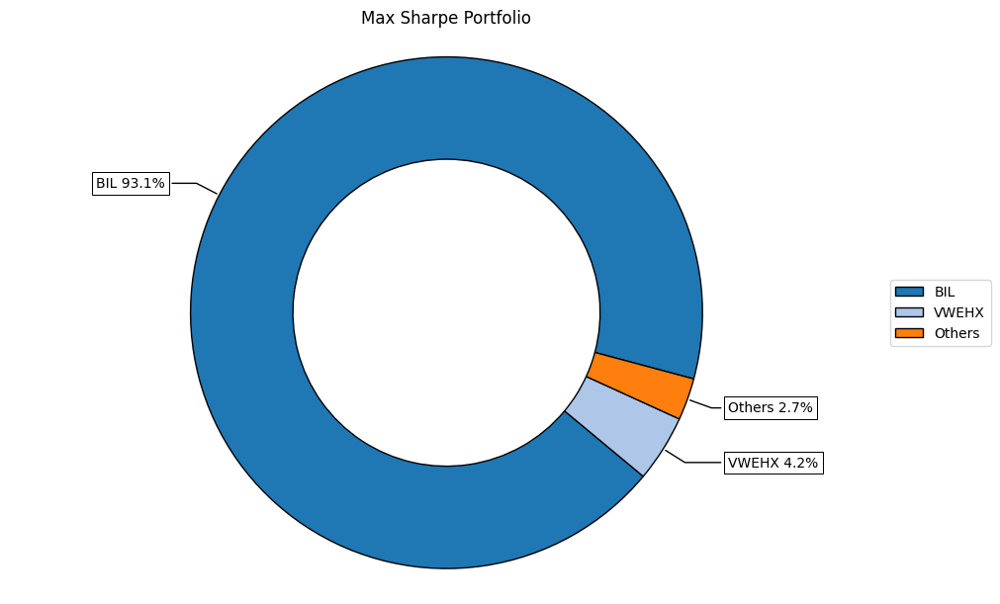

In [35]:
# Plotting the composition of the Max Sharpe portfolio
ax = rp.plot_pie(w=max_sharpe, title='Max Sharpe Portfolio', others=0.05, nrow=10, cmap="tab20", height=6, width=10, ax=None)

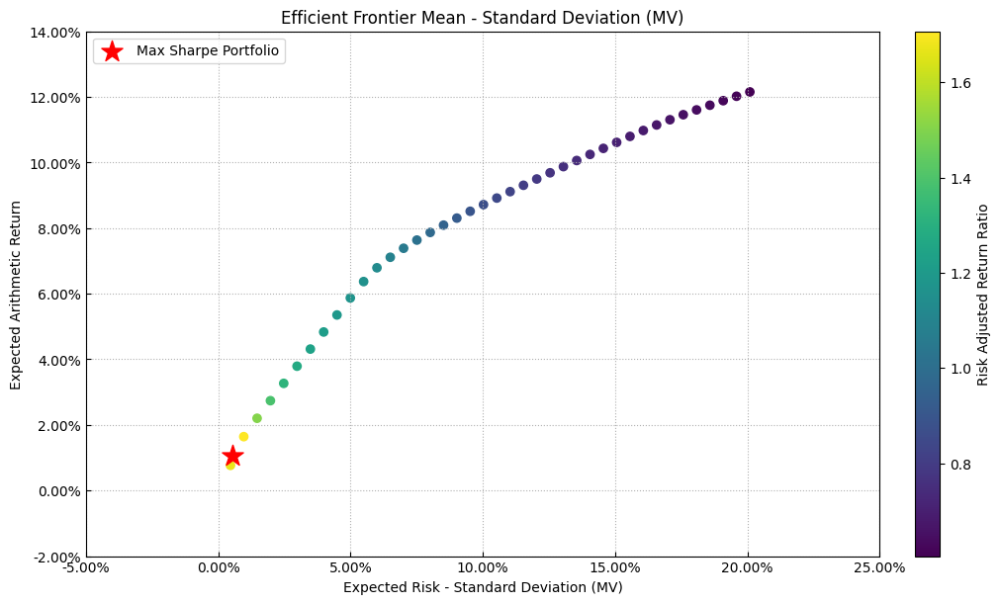

In [36]:
# Max Sharpe Efficiente Frontier
points = 40 # Number of points of the frontier
max_sharpefrontier = port.efficient_frontier(model=model, rm=rm, points=points, rf=rf, hist=hist)

# Plotting Max Sharpe Efficient Frontier
ax = rp.plot_frontier(w_frontier=max_sharpefrontier, mu=port.mu, cov=port.cov, returns=port.returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=max_sharpe,label='Max Sharpe Portfolio',
                      marker='*', s=16, c='r', height=6, width=10, ax=None, t_factor=t_factor)

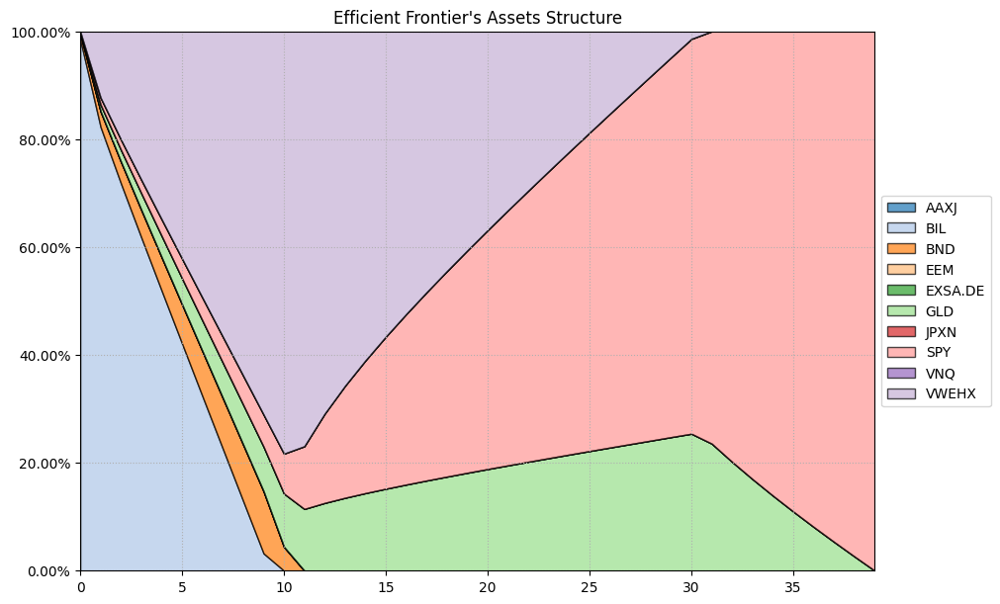

In [37]:
# Plotting Max Sharpe efficient frontier composition
ax = rp.plot_frontier_area(w_frontier=max_sharpefrontier, cmap="tab20", height=6, width=10, ax=None)

### Otimizacao com restricoes

In [38]:
asset_classes = pd.read_csv(r'riskfolio_tickers_w_classes.csv', delimiter=',')
asset_classes

,ticker,geografia,tipo,mercado
0,AAXJ,asia,acoes,emergente
1,BIL,usa,moneymarket,NaN
2,BND,global,obrigacoes,NaN
3,EEM,global,acoes,emergente
4,EXSA.DE,europa,acoes,desenvolvido
5,GLD,global,commodities,NaN
6,JPXN,japao,acoes,desenvolvido
7,SPY,usa,acoes,desenvolvido
8,VNQ,usa,reit,NaN
9,VWEHX,global,obrigacoes,NaN


In [39]:
tests_constraints = pd.read_csv(r'riskfolio_tests_constraints.csv', delimiter=',')
tests_constraints

,Disabled,Type,Set,Position,Sign,Weight,Type Relative,Relative Set,Relative,Factor
0,False,All Assets,NaN,NaN,<=,0.25,NaN,NaN,NaN,NaN
1,False,Classes,geografia,global,>=,0.20,NaN,NaN,NaN,NaN
2,False,Classes,geografia,europa,>=,0.15,NaN,NaN,NaN,NaN
3,False,Classes,geografia,usa,<,0.50,NaN,NaN,NaN,NaN
4,False,Classes,geografia,japao,>=,0.05,NaN,NaN,NaN,NaN
5,False,Classes,geografia,asia,>=,0.05,NaN,NaN,NaN,NaN
6,False,Classes,tipo,acoes,<=,0.70,NaN,NaN,NaN,NaN
7,False,Classes,tipo,obrigacoes,<=,0.50,NaN,NaN,NaN,NaN
8,False,Classes,tipo,reit,>=,0.05,NaN,NaN,NaN,NaN
9,False,Classes,tipo,commodities,>=,0.05,NaN,NaN,NaN,NaN


In [40]:
rm = 'MV'
obj = 'Sharpe'

# CSV constraints
A, B = rp.assets_constraints(tests_constraints, asset_classes)
port = rp.Portfolio(returns = quotes_pct_ret, ainequality = A, binequality = B)

port.lowerret = None
port.upperdev = None

port.assets_stats(method_mu = method_mu, method_cov = method_cov)

# Estimate optimal portfolio:
contraints_portfolio = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)

pd.options.display.float_format = '{:.2%}'.format
display(contraints_portfolio.T)
pd.options.display.float_format = None

You must convert self.cov to a positive definite matrix


,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
weights,5.00%,25.00%,0.00%,0.00%,15.00%,11.63%,5.00%,20.00%,5.00%,13.37%


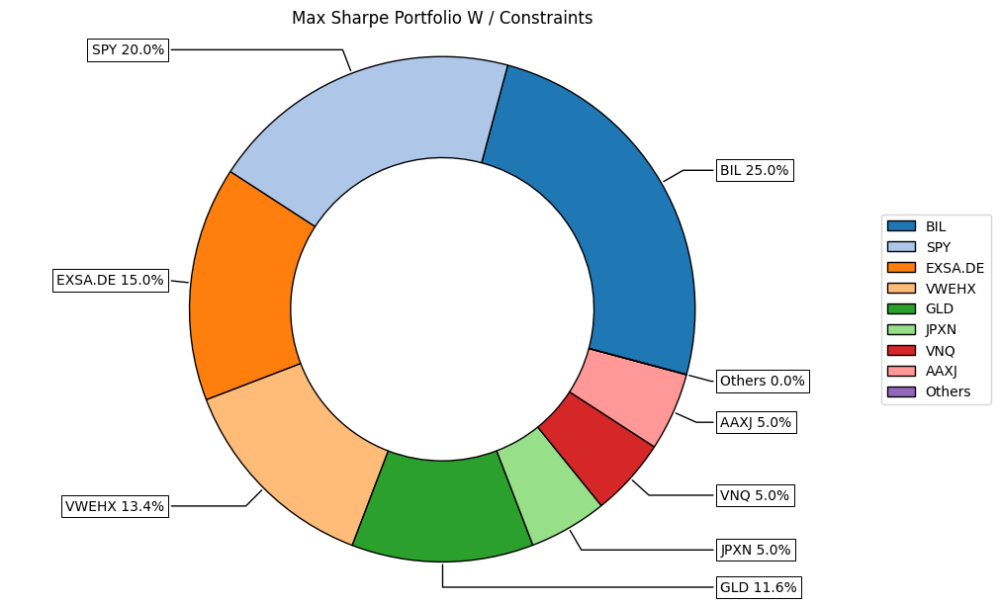

In [41]:
# Plotting the composition of the Max Sharpe portfolio
ax = rp.plot_pie(w=contraints_portfolio, title='Max Sharpe Portfolio W / Constraints', others=0.05, nrow=10, cmap="tab20", height=6, width=10, ax=None)

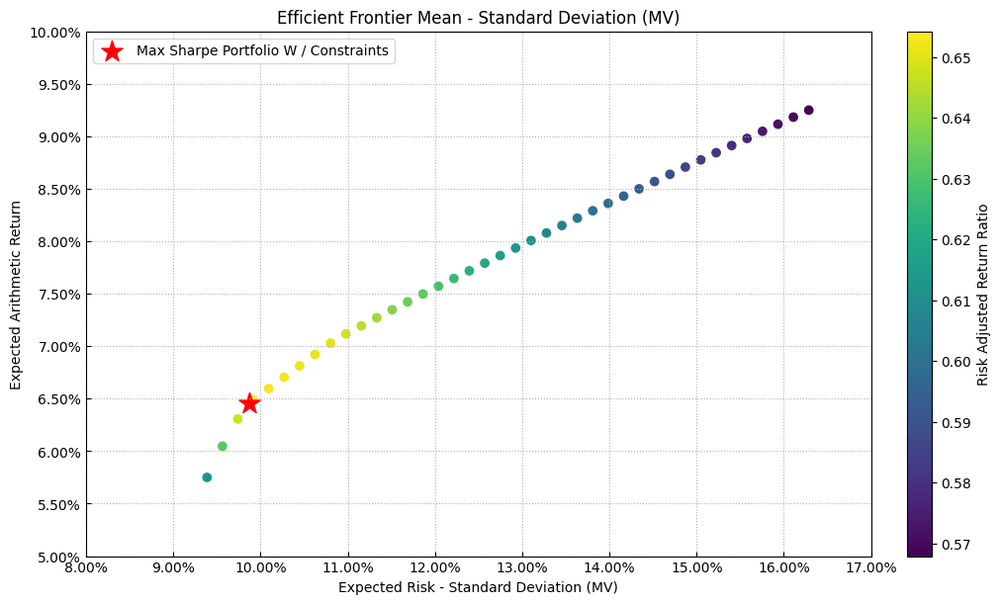

In [42]:
# Efficiente Frontier W / constraints
points = 40 # Number of points of the frontier
constraintsfrontier = port.efficient_frontier(model=model, rm=rm, points=points, rf=rf, hist=hist)

# Plotting Efficient Frontier W / constraints
ax = rp.plot_frontier(w_frontier=constraintsfrontier, mu=port.mu, cov=port.cov, returns=port.returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=contraints_portfolio,label='Max Sharpe Portfolio W / Constraints',
                      marker='*', s=16, c='r', height=6, width=10, ax=None, t_factor=t_factor)

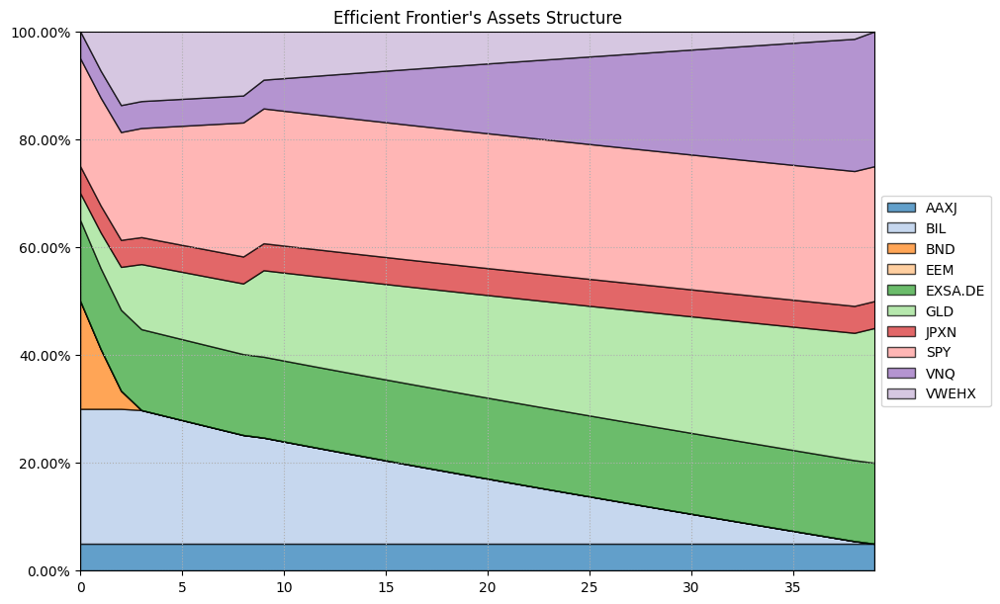

In [43]:
# Plotting efficient frontier composition
ax = rp.plot_frontier_area(w_frontier=constraintsfrontier, cmap="tab20", height=6, width=10, ax=None)

# Portfolio Familia Torga

In [44]:
asset_classes = pd.read_csv(r'riskfolio_tickers_w_classes.csv', delimiter=',')
asset_classes

,ticker,geografia,tipo,mercado
0,AAXJ,asia,acoes,emergente
1,BIL,usa,moneymarket,NaN
2,BND,global,obrigacoes,NaN
3,EEM,global,acoes,emergente
4,EXSA.DE,europa,acoes,desenvolvido
5,GLD,global,commodities,NaN
6,JPXN,japao,acoes,desenvolvido
7,SPY,usa,acoes,desenvolvido
8,VNQ,usa,reit,NaN
9,VWEHX,global,obrigacoes,NaN


In [45]:
torga_constraints = pd.read_csv(r'riskfolio_torga_constraints.csv', delimiter=',')
torga_constraints

,Disabled,Type,Set,Position,Sign,Weight,Type Relative,Relative Set,Relative,Factor
0,False,All Assets,NaN,NaN,<=,0.40,NaN,NaN,NaN,NaN
1,False,Classes,tipo,acoes,<,0.50,NaN,NaN,NaN,NaN
2,False,Classes,geografia,europa,>=,0.10,NaN,NaN,NaN,NaN
3,False,Classes,mercado,emergente,<,0.10,NaN,NaN,NaN,NaN
4,False,Classes,tipo,moneymarket,>=,0.10,NaN,NaN,NaN,NaN
5,False,Classes,tipo,reit,>=,0.05,NaN,NaN,NaN,NaN
6,False,Classes,tipo,commodities,>=,0.05,NaN,NaN,NaN,NaN


In [46]:
rm = 'MV'
obj = 'Sharpe'

# CSV constraints
A, B = rp.assets_constraints(torga_constraints, asset_classes)
port = rp.Portfolio(returns = quotes_pct_ret, ainequality = A, binequality = B)

# Returns, Variance Constraints
port.lowerret = 0.0842/days_per_year # transform annual return to daily return
port.upperdev = 0.15/days_per_year**0.5 # Maxima volatilidade aceitavel

port.assets_stats(method_mu = method_mu, method_cov = method_cov)

# Estimate optimal portfolio:
torga_portfolio = port.optimization(model=model, rm=rm, obj=obj, rf=rf, l=l, hist=hist)

pd.options.display.float_format = '{:.2%}'.format
display(torga_portfolio.T)
pd.options.display.float_format = None

You must convert self.cov to a positive definite matrix


,AAXJ,BIL,BND,EEM,EXSA.DE,GLD,JPXN,SPY,VNQ,VWEHX
weights,10.00%,10.00%,0.00%,0.00%,10.00%,27.78%,0.00%,30.00%,12.22%,0.00%


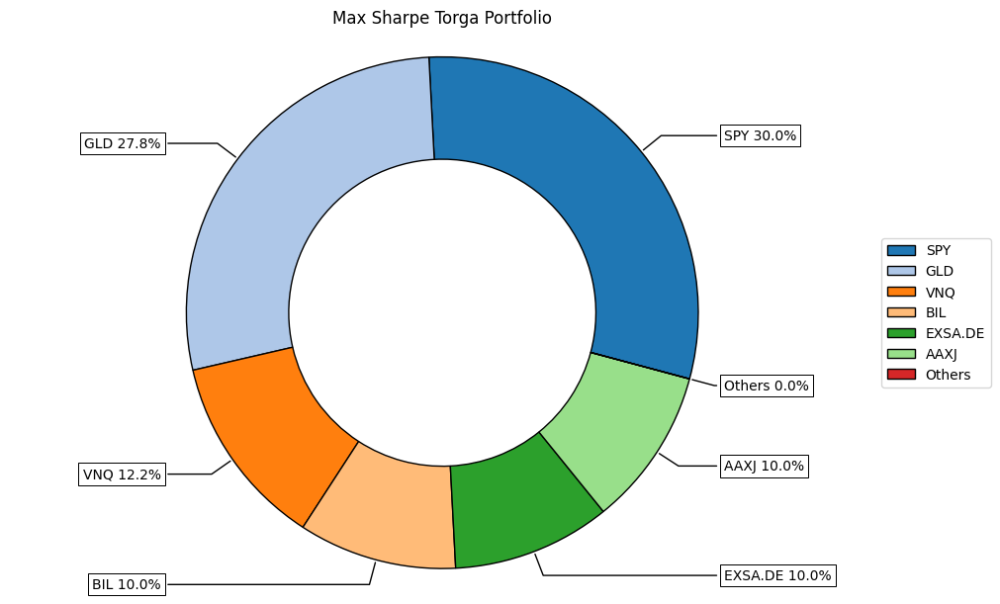

In [47]:
# Plotting the composition of the Torga Family portfolio
ax = rp.plot_pie(w=torga_portfolio, title='Max Sharpe Torga Portfolio', others=0.05, nrow=10, cmap="tab20", height=6, width=10, ax=None)

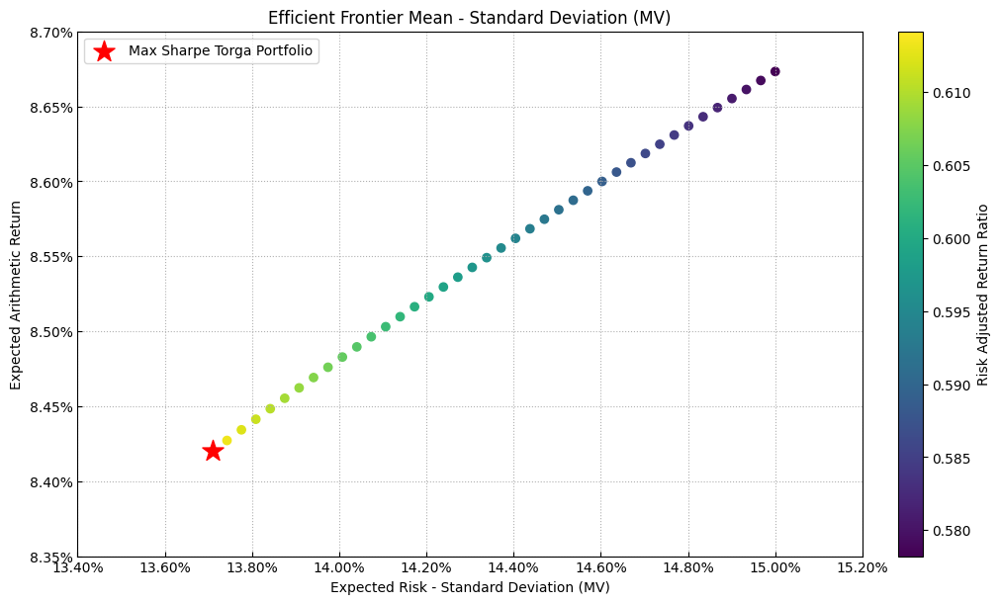

In [48]:
# Torga Efficiente Frontier
torgafrontier = port.efficient_frontier(model=model, rm=rm, points=40, rf=rf, hist=hist)

# Plotting Torga Efficient Frontier
ax = rp.plot_frontier(w_frontier=torgafrontier, mu=port.mu, cov=port.cov, returns=port.returns, rm=rm,
                      rf=rf, alpha=0.05, cmap='viridis', w=torga_portfolio,label='Max Sharpe Torga Portfolio',
                      marker='*', s=16, c='r', height=6, width=10, ax=None, t_factor=t_factor)

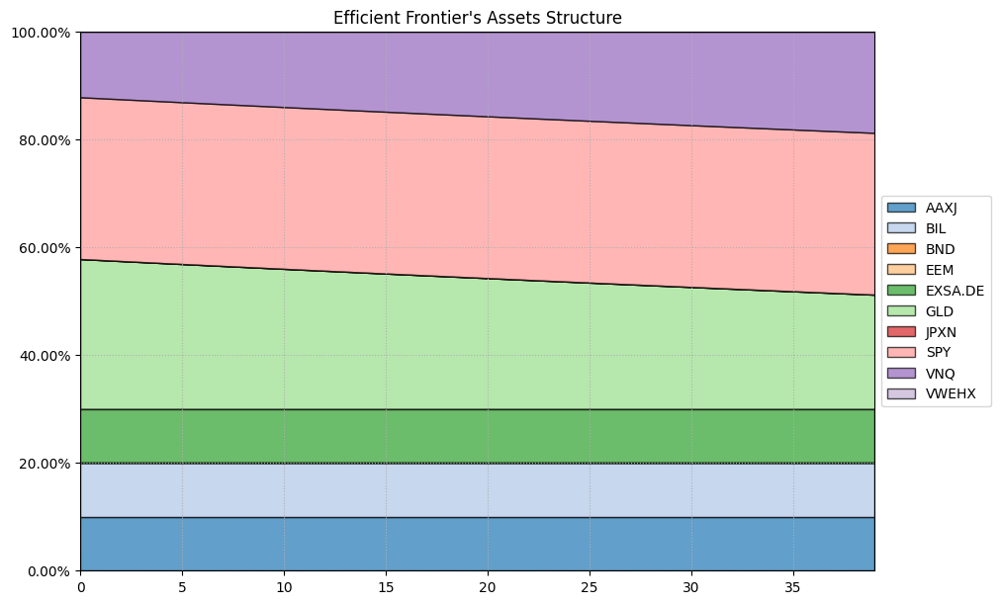

In [49]:
# Plotting efficient frontier composition
ax = rp.plot_frontier_area(w_frontier=torgafrontier, cmap="tab20", height=6, width=10, ax=None)

In [50]:
pd.options.display.float_format = '{:.2%}'.format

torga_classes = pd.concat([asset_classes.set_index('ticker'), torga_portfolio], axis=1)
display(torga_classes)

,geografia,tipo,mercado,weights
AAXJ,asia,acoes,emergente,10.00%
BIL,usa,moneymarket,NaN,10.00%
BND,global,obrigacoes,NaN,0.00%
EEM,global,acoes,emergente,0.00%
EXSA.DE,europa,acoes,desenvolvido,10.00%
GLD,global,commodities,NaN,27.78%
JPXN,japao,acoes,desenvolvido,0.00%
SPY,usa,acoes,desenvolvido,30.00%
VNQ,usa,reit,NaN,12.22%
VWEHX,global,obrigacoes,NaN,0.00%


In [51]:
torga_geografia = torga_classes.groupby(['geografia']).sum()
torga_geografia

,tipo,mercado,weights
geografia,,,
asia,acoes,emergente,10.00%
europa,acoes,desenvolvido,10.00%
global,obrigacoesacoescommoditiesobrigacoes,emergente,27.78%
japao,acoes,desenvolvido,0.00%
usa,moneymarketacoesreit,desenvolvido,52.22%


In [52]:
torga_tipo = torga_classes.groupby(['tipo']).sum()
torga_tipo

,geografia,mercado,weights
tipo,,,
acoes,asiaglobaleuropajapaousa,emergenteemergentedesenvolvidodesenvolvidodese...,50.00%
commodities,global,0,27.78%
moneymarket,usa,0,10.00%
obrigacoes,globalglobal,0,0.00%
reit,usa,0,12.22%


In [53]:
# GUARDAR TABELAS

# Torga geografia
torga_geografia.to_csv("torga_geografia.csv", index=True)

# Torga tipo
torga_tipo.to_csv("torga_tipo.csv", index=True)

## Torga Portfolio Report

                                     CVXPY                                     
                                     v1.6.5                                    
(CVXPY) Apr 15 01:27:21 PM: Your problem has 15874 variables, 27777 constraints, and 0 parameters.
(CVXPY) Apr 15 01:27:21 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Apr 15 01:27:21 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Apr 15 01:27:21 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Apr 15 01:27:21 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Apr 15 01:27:21 PM: Compiling problem (target solver=CLAR

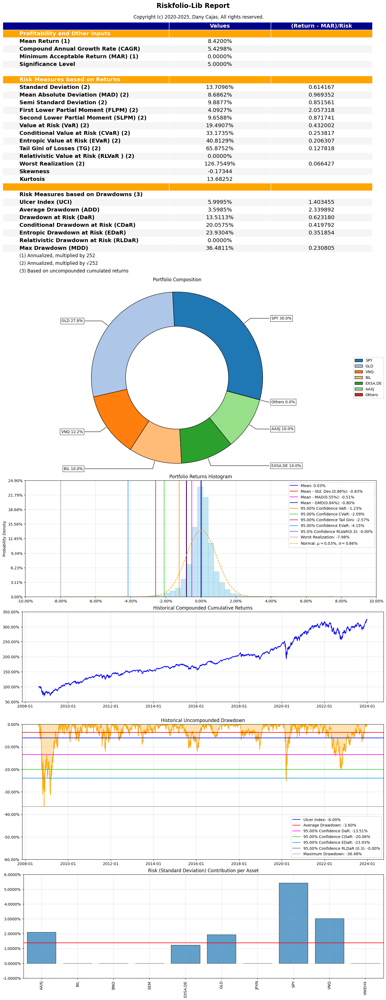

In [54]:
returns = port.returns

ax = rp.jupyter_report(returns, w = torga_portfolio, rm=rm, rf=rf, alpha=0.05, others=0.05, nrow=25, height=6,
                       width=14, t_factor=t_factor, ini_days=1, days_per_year=days_per_year, bins=50, solver='ECOS')

# Simulacao Monte Carlo

In [55]:
# Inputs
num_simulations = 10_000
years = 5  # Número de anos
time_horizon = 252 * years  # 20 anos de dias úteis
expected_return = 0.0842  # Retorno esperado anual da carteira
portfolio_std_dev = 0.1371  # Desvio padrão anual da carteira
initial_portfolio_value = 111_000  # Valor inicial da carteira

# Simulação de Monte Carlo
simulation_results = np.zeros((time_horizon, num_simulations))

for i in range(num_simulations):
    # Gerando retornos diários assumindo distribuição normal
    daily_return_mean = expected_return / 252
    daily_return_std = portfolio_std_dev / np.sqrt(252)
    daily_returns = np.random.normal(daily_return_mean, daily_return_std, time_horizon)
    # Calculando o valor acumulado da carteira
    simulation_results[:, i] = initial_portfolio_value * np.cumprod(1 + daily_returns)

# Converter resultados para DataFrame
results_df = pd.DataFrame(simulation_results)

# Calcular a média das simulações
mean_simulation = results_df.mean(axis=1)

In [56]:
# Criar uma figura Plotly para as simulações
MonteCarlo = go.Figure()

# Selecionar 100 linhas para plottar
selected_lines = results_df.sample(n=100, axis=1, random_state=1)  # 22 linhas aleatórias
selected_lines = pd.concat([selected_lines, results_df[[results_df.idxmax(axis=1).iloc[-1]]], results_df[[results_df.idxmin(axis=1).iloc[-1]]]], axis=1)  # Adiciona a máxima e mínima

# Adicionar cada linha selecionada ao gráfico
for col in selected_lines.columns:
    MonteCarlo.add_trace(go.Scatter(x=selected_lines.index, y=selected_lines[col], mode='lines', line=dict(color='grey'), opacity=0.5))

# Adicionar a linha média ao gráfico
MonteCarlo.add_trace(go.Scatter(name='mean', x=results_df.index, y=mean_simulation, mode='lines', line=dict(color='red', dash='dash')))

# Alterações ao gráfico
MonteCarlo.update_layout(
    title='Simulação Monte Carlo Portfolio Torga',
    yaxis_title='Valor carteira',
    yaxis_ticksuffix=' €',
    xaxis_title="Nr de dias simulados",
    template='simple_white',
    height=650, width=1000,
    showlegend=False,
    legend=dict(yanchor="bottom", y=-0.3, xanchor="center", x=0.5)
)

MonteCarlo.show()

# Resultados finais e risco anualizado
expected_final_value = mean_simulation.iloc[-1]
portfolio_risk_annual = np.std(results_df.iloc[-1]) / initial_portfolio_value / np.sqrt(years)

print(f'\n\nNr de simulacoes {num_simulations}')
print(f'Nr de dias a testar {time_horizon}')
print(f"Valor Esperado Final da Carteira: {expected_final_value:.2f}")
print(f"Risco Anual da Carteira (Desvio Padrão): {portfolio_risk_annual:.4f}")



Nr de simulacoes 10000
Nr de dias a testar 1260
Valor Esperado Final da Carteira: 169096.33
Risco Anual da Carteira (Desvio Padrão): 0.2139


In [57]:
# Criar uma figura Plotly para o histograma
final_values = results_df.iloc[-1]
histogram = go.Figure()

# Adicionar o histograma ao gráfico
histogram.add_trace(go.Histogram(x=final_values, nbinsx=40, marker=dict(color='grey', line=dict(color='black', width=1))))

# Adicionar linha da média ao histograma
histogram.add_trace(go.Scatter(x=[expected_final_value, expected_final_value], y=[0, num_simulations/5.5], mode='lines', line=dict(color='red', dash='dash')))

# Alterações ao gráfico
histogram.update_layout(
    title=f'Distribuição dos Valores Finais da Carteira em {years} Anos',
    xaxis_title='Valor carteira',
    xaxis_ticksuffix=' €',
    yaxis_title='Frequência',
    template='simple_white',
    height=650, width=1000,
    showlegend=False,
)

# Mostrar o histograma
histogram.show()